In [2]:
from torchvision import models

In [3]:
backbone = models.resnet34(pretrained=True)

In [4]:
a = list(backbone.children())

In [9]:
a[-3:]

[Sequential(
   (0): BasicBlock(
     (conv1): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
     (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (downsample): Sequential(
       (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
       (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     )
   )
   (1): BasicBlock(
     (conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn2): Batc

# Text Label 

In [ ]:
events_text = {'act01': 'write an email',
                'act02': 'read on screen',
                'act03': 'edit/create presentation',
                'act04': 'zone out and fixate',
                'act05': 'use a calculator to add up numbers on sheet',
                'act06': 'physical precision task',
                'act07': 'put documents in order',
                'act08': 'read text/numbers on page',
                'act09': 'arrange money in change jar',
                'act10': 'write on paper with pen',
                'act11': 'watch a youtube video',
                'act12': 'go to a news website and browse',
                'act13': 'have conversation with experimenter in room',
                'act14': 'make a telephone call',
                'act15': 'drink/eat for 2 minutes',
                'act16': 'close eyes and sit still',
                'act17': 'clean e.g. sweaping the floor, wipe, ...',
                'act18': 'exercise: sit up/stand down repeatedly',
                'act19': 'hand-eye coordination (tennis ball)',
                'act20': 'pace the room',
                }

# COMBINE BOTH A and B dataset

## Split data

In [1]:
import os
import random
random.seed(1509)

FOLDER = '/mnt/sda/hong01-data/MART_DATA/OUTPUT_MERGED/AUTOGRAPHER'
all_files = sorted(os.listdir(FOLDER))
availabel = [x for x in all_files if 'train' in x]

In [2]:
len(availabel) # number of availabel label

1830

In [3]:
len(all_files) # total files

2752

In [4]:
activities = {}
list_activity = ['0'+str(x) for x in range(1, 10)]
list_activity += [str(x) for x in range(10, 21)]

In [5]:
for act in list_activity:
    img_act = [x for x in availabel if f"act{act}" in x]
    activities[act] = img_act
    print(f"Numb Images in act{act}: {len(img_act)}")

Numb Images in act01: 97
Numb Images in act02: 108
Numb Images in act03: 100
Numb Images in act04: 115
Numb Images in act05: 88
Numb Images in act06: 85
Numb Images in act07: 78
Numb Images in act08: 105
Numb Images in act09: 76
Numb Images in act10: 94
Numb Images in act11: 111
Numb Images in act12: 106
Numb Images in act13: 80
Numb Images in act14: 97
Numb Images in act15: 85
Numb Images in act16: 110
Numb Images in act17: 78
Numb Images in act18: 72
Numb Images in act19: 76
Numb Images in act20: 69


In [6]:
train_activities = {}
val_activities = {}
test_activities = {}

train_portion = 0.8
val_portion = 0.1

for idx, act in enumerate(list_activity):
    imgs = activities[act]
    numb_imgs = len(imgs)
    numb_train = int(train_portion * numb_imgs)
    numb_val = int(val_portion * numb_imgs)
    
    random.seed(1509+idx)
    random.shuffle(imgs)
    
    train_activities[act] = imgs[0:numb_train]
    val_activities[act] = imgs[numb_train:(numb_train+numb_val)]
    test_activities[act] = imgs[(numb_train+numb_val):]

In [9]:
train_activities['01'][0:5]

['1005_trainA_act01_6.jpg',
 '1003_trainA_act01_0.jpg',
 '1001_trainA_act01_5.jpg',
 '1006_trainA_act01_0.jpg',
 '1001_trainB_act01_5.jpg']

## Export to TXT Files

In [11]:
list_train_txt = []
list_val_txt = []
list_test_txt = []

for act in list_activity:
    list_train_txt += [f"{x} {act}" for x in train_activities[act]]
    list_val_txt += [f"{x} {act}" for x in val_activities[act]]
    list_test_txt += [f"{x} {act}" for x in test_activities[act]]

In [12]:
print(f"Train: {len(list_train_txt)}\nVal: {len(list_val_txt)}\nTest: {len(list_test_txt)}")

Train: 1457
Val: 173
Test: 200


In [13]:
random.seed(1309)
random.shuffle(list_train_txt)
random.shuffle(list_val_txt)
random.shuffle(list_test_txt)

In [14]:
list_train_txt[0:5]

['1005_trainB_act19_1.jpg 19',
 '1007_trainA_act01_1.jpg 01',
 '1004_trainA_act16_7.jpg 16',
 '1005_trainA_act08_4.jpg 08',
 '1004_trainA_act11_8.jpg 11']

In [18]:
with open('train.txt', 'w') as f:
    for line in list_train_txt:
        f.write(f'{line}\n')

In [19]:
with open('val.txt', 'w') as f:
    for line in list_val_txt:
        f.write(f'{line}\n')

In [20]:
with open('test.txt', 'w') as f:
    for line in list_test_txt:
        f.write(f'{line}\n')

# Train on dataset A but validate and test on B

In [15]:
import os
import random
random.seed(1509)

FOLDER = '/mnt/sda/hong01-data/MART_DATA/OUTPUT_MERGED/AUTOGRAPHER'
all_files = sorted(os.listdir(FOLDER))
availabelA = [x for x in all_files if 'trainA' in x]
availabelB = [x for x in all_files if 'trainB' in x]

In [16]:
len(availabelA)

918

In [17]:
len(availabelB)

912

In [18]:
list_activity = ['0'+str(x) for x in range(1, 10)]
list_activity += [str(x) for x in range(10, 21)]
for act in list_activity:
    img_act = [x for x in availabelA if f"act{act}" in x]
    print(f"Numb Images in act{act}: {len(img_act)}")

Numb Images in act01: 47
Numb Images in act02: 52
Numb Images in act03: 49
Numb Images in act04: 57
Numb Images in act05: 47
Numb Images in act06: 42
Numb Images in act07: 38
Numb Images in act08: 53
Numb Images in act09: 37
Numb Images in act10: 46
Numb Images in act11: 56
Numb Images in act12: 55
Numb Images in act13: 38
Numb Images in act14: 51
Numb Images in act15: 44
Numb Images in act16: 56
Numb Images in act17: 38
Numb Images in act18: 38
Numb Images in act19: 40
Numb Images in act20: 34


In [19]:
list_train_txt = [f"{x} {x.split('_')[-2][-2:]}" for x in availabelA]

In [20]:
list_train_txt[0:5]

['1001_trainA_act01_0.jpg 01',
 '1001_trainA_act01_1.jpg 01',
 '1001_trainA_act01_2.jpg 01',
 '1001_trainA_act01_3.jpg 01',
 '1001_trainA_act01_4.jpg 01']

In [10]:
random.seed(1309)
random.shuffle(list_train_txt)
with open('dataset/train_A.txt', 'w') as f:
    for line in list_train_txt:
        f.write(f'{line}\n')

In [12]:
activities = {}
list_activity = ['0'+str(x) for x in range(1, 10)]
list_activity += [str(x) for x in range(10, 21)]
for act in list_activity:
    img_act = [x for x in availabelB if f"act{act}" in x]
    activities[act] = img_act
    print(f"Numb Images in act{act}: {len(img_act)}")

Numb Images in act01: 50
Numb Images in act02: 56
Numb Images in act03: 51
Numb Images in act04: 58
Numb Images in act05: 41
Numb Images in act06: 43
Numb Images in act07: 40
Numb Images in act08: 52
Numb Images in act09: 39
Numb Images in act10: 48
Numb Images in act11: 55
Numb Images in act12: 51
Numb Images in act13: 42
Numb Images in act14: 46
Numb Images in act15: 41
Numb Images in act16: 54
Numb Images in act17: 40
Numb Images in act18: 34
Numb Images in act19: 36
Numb Images in act20: 35


In [15]:
val_activities = {}
test_activities = {}

val_portion = 0.7

for idx, act in enumerate(list_activity):
    imgs = activities[act]
    numb_imgs = len(imgs)
    numb_val = int(val_portion * numb_imgs)
    
    random.seed(1509+idx)
    random.shuffle(imgs)
    
    val_activities[act] = imgs[0:numb_val]
    test_activities[act] = imgs[numb_val:]
    
list_val_txt = []
list_test_txt = []

for act in list_activity:
    list_val_txt += [f"{x} {act}" for x in val_activities[act]]
    list_test_txt += [f"{x} {act}" for x in test_activities[act]]

In [19]:
random.seed(1309)
random.shuffle(list_val_txt)
random.shuffle(list_test_txt)

In [20]:
with open('dataset/val_B.txt', 'w') as f:
    for line in list_val_txt:
        f.write(f'{line}\n')
with open('dataset/test_B.txt', 'w') as f:
    for line in list_test_txt:
        f.write(f'{line}\n')

# TEST THE MODEL

In [4]:
from mart_controller import MART_Evaluator
from PIL import Image

In [5]:
MODEL_NAME = 'EFFICIENT-B4'
CROP_SIZE = 224
CHECKPOINT = 'RUN_1_Unfreeze/EFFICIENT-B4-15082020-023229.pth.tar'

model_info = {}
model_info['model_name'] = MODEL_NAME
model_info['crop_size'] = CROP_SIZE
model_info['checkpoint'] = CHECKPOINT

evaluator = MART_Evaluator(model_info)

Loaded pretrained weights for efficientnet-b4
LOAD PRETRAINED MODEL AT RUN_1_Unfreeze/EFFICIENT-B4-15082020-023229.pth.tar


## Evaluate on TXT File

In [8]:
DATA_DIR = '/mnt/sda/hong01-data/MART_DATA/OUTPUT_MERGED/AUTOGRAPHER'
TXT_FILE = 'dataset/val.txt'

loss, acc = evaluator.evaluate(DATA_DIR, TXT_FILE)
(loss, acc)

(1.3992137134244496, 0.8728323699421965)

## Test on Custom Image

In [9]:
events_text = ['write an email', 'read on screen', 'edit/create presentation', 'zone out and fixate',
               'use a calculator to add up numbers on sheet', 'physical precision task', 'put documents in order',
               'read text/numbers on page', 'arrange money in change jar', 'write on paper with pen',
               'watch a youtube video', 'go to a news website and browse', 
               'have conversation with experimenter in room', 'make a telephone call',
               'drink/eat for 2 minutes', 'close eyes and sit still', 'clean e.g. sweaping the floor, wipe, ...',
               'exercise: sit up/stand down repeatedly',
               'hand-eye coordination (tennis ball)', 'pace the room']

In [10]:
img_path = f"{DATA_DIR}/1005_trainB_act17_4.jpg"
image = Image.open(img_path).convert('RGB')

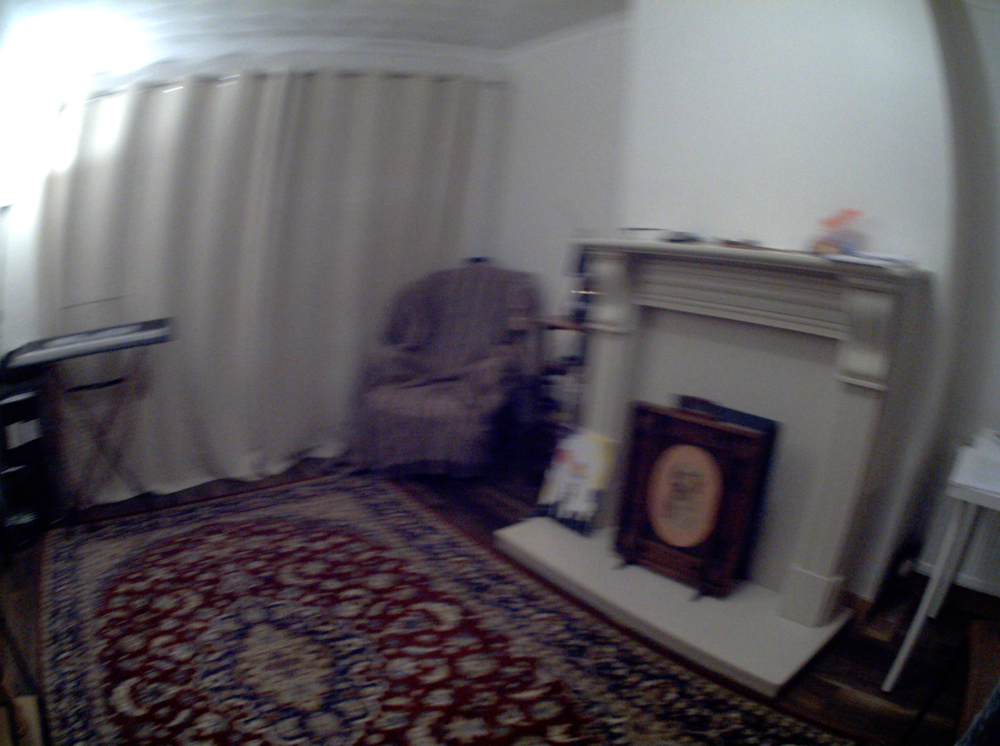

In [11]:
image

In [12]:
pred_lbl, probs = evaluator.test_image(img_path)

In [13]:
pred_act = pred_lbl.item() # note that act = label + 1 (this prediction is an index)
print(f"act{pred_act+1}: {events_text[pred_act]}")

act17: clean e.g. sweaping the floor, wipe, ...


In [14]:
props_logsoftmax = probs.cpu().numpy() # this is log_softmax [-inf, 0]
props_logsoftmax

array([[-1.4972464e+01, -1.7492611e+01, -1.2448330e+01, -1.7458883e+01,
        -1.5486122e+01, -8.6639633e+00, -1.9225037e+01, -1.4926891e+01,
        -1.3939465e+01, -1.3911303e+01, -1.4247192e+01, -1.4953552e+01,
        -1.2606609e+01, -9.3335609e+00, -1.8568743e+01, -1.6785208e+01,
        -8.1353188e-03, -7.1621513e+00, -9.4805775e+00, -4.9649239e+00]],
      dtype=float32)

## Explore distribution data

In [1]:
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
import joblib

IMG_DIR = '/mnt/sda/hong01-data/MART_DATA/OUTPUT_MERGED/AUTOGRAPHER'
PANDAS_DIR = '/mnt/sda/hong01-data/MART_DATA/OUTPUT_MERGED/PANDAS'
dataset = 'trainA' # trainA, trainB, test

all_imgs = sorted(os.listdir(IMG_DIR))
data = pd.read_csv(f"{PANDAS_DIR}/{dataset}.csv")

In [3]:
data.head(5)

,Unnamed: 0,sub_id,event_id,source,data_HR_activity_median,data_HR_activity_min,data_HR_activity_max,data_HR_activity_average,data_HR_activity_std,data_HR_activity_len,...,"data_AUTOGRAPHER_RESNET_max_buckeye, horse chestnut, conker",data_AUTOGRAPHER_RESNET_max_coral fungus,data_AUTOGRAPHER_RESNET_max_agaric,data_AUTOGRAPHER_RESNET_max_gyromitra,"data_AUTOGRAPHER_RESNET_max_stinkhorn, carrion fungus",data_AUTOGRAPHER_RESNET_max_earthstar,"data_AUTOGRAPHER_RESNET_max_hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa",data_AUTOGRAPHER_RESNET_max_bolete,"data_AUTOGRAPHER_RESNET_max_ear, spike, capitulum","data_AUTOGRAPHER_RESNET_max_toilet tissue, toilet paper, bathroom tissue"
0,0,1001,act01,trainA,84.507042,76.923077,100.000000,84.577495,3.933112,90,...,0.000728,0.000090,0.000920,0.000048,0.000100,0.000287,0.000317,0.000290,0.001594,0.001767
1,1,1001,act02,trainA,83.333333,71.428571,100.000000,82.631420,5.642256,89,...,0.001809,0.000228,0.002908,0.000167,0.000224,0.000654,0.000971,0.000937,0.007302,0.013306
2,2,1001,act03,trainA,83.920188,76.923077,90.909091,84.207147,2.827778,90,...,0.000996,0.000154,0.002684,0.000104,0.000201,0.000685,0.000620,0.000566,0.006093,0.005520
3,3,1001,act04,trainA,90.909091,75.949367,95.238095,90.808707,3.444775,90,...,0.000221,0.000026,0.000981,0.000012,0.000029,0.000107,0.000153,0.000196,0.001718,0.008672
4,4,1001,act05,trainA,82.191781,80.000000,88.235294,82.729338,1.852634,89,...,0.001805,0.000118,0.000567,0.000041,0.000146,0.000361,0.000695,0.000123,0.001332,0.008550


In [2]:
sub_id = list(data['sub_id'])
event_id = list(data['event_id'])
source = list(data['source'])
task_id = [f"{x}_{y}_{z}" for x, y, z in zip(sub_id, source, event_id)]

In [3]:
task_images = dict()
for task in task_id:
    list_img = [x for x in all_imgs if task in x]
    task_images[task] = list_img
    print(f"{task}: {len(list_img)}")

1001_trainA_act01: 8
1001_trainA_act02: 7
1001_trainA_act03: 8
1001_trainA_act04: 9
1001_trainA_act05: 7
1001_trainA_act06: 7
1001_trainA_act07: 6
1001_trainA_act08: 16
1001_trainA_act09: 6
1001_trainA_act10: 6
1001_trainA_act11: 8
1001_trainA_act12: 8
1001_trainA_act13: 8
1001_trainA_act14: 9
1001_trainA_act15: 6
1001_trainA_act16: 8
1001_trainA_act17: 6
1001_trainA_act18: 5
1001_trainA_act19: 6
1001_trainA_act20: 4
1002_trainA_act01: 8
1002_trainA_act02: 8
1002_trainA_act03: 8
1002_trainA_act04: 8
1002_trainA_act05: 8
1002_trainA_act06: 6
1002_trainA_act07: 6
1002_trainA_act08: 8
1002_trainA_act09: 5
1002_trainA_act10: 7
1002_trainA_act11: 8
1002_trainA_act12: 8
1002_trainA_act13: 6
1002_trainA_act14: 7
1002_trainA_act15: 6
1002_trainA_act16: 8
1002_trainA_act17: 6
1002_trainA_act18: 6
1002_trainA_act19: 6
1002_trainA_act20: 5
1003_trainA_act01: 5
1003_trainA_act02: 5
1003_trainA_act03: 5
1003_trainA_act04: 6
1003_trainA_act05: 6
1003_trainA_act06: 4
1003_trainA_act07: 5
1003_trainA_

## Manually Assign Pred Label

In [1]:
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
import joblib
import ipyplot
from PIL import Image

IMG_DIR = '/mnt/sda/hong01-data/MART_DATA/OUTPUT_MERGED/AUTOGRAPHER'
PANDAS_DIR = '/mnt/sda/hong01-data/MART_DATA/OUTPUT_MERGED/PANDAS'
dataset = 'test' # trainA, trainB, test

all_imgs = sorted(os.listdir(IMG_DIR))
data = pd.read_csv(f"{PANDAS_DIR}/{dataset}.csv")

sub_id = data['sub_id']
event_id = data['event_id']
task_id = [f"{x}_{y}" for x, y in zip(sub_id, event_id)]

In [2]:
data.head(5)

,Unnamed: 0,sub_id,event_id,source,data_HR_activity_median,data_HR_activity_min,data_HR_activity_max,data_HR_activity_average,data_HR_activity_std,data_HR_activity_len,...,"data_AUTOGRAPHER_RESNET_max_buckeye, horse chestnut, conker",data_AUTOGRAPHER_RESNET_max_coral fungus,data_AUTOGRAPHER_RESNET_max_agaric,data_AUTOGRAPHER_RESNET_max_gyromitra,"data_AUTOGRAPHER_RESNET_max_stinkhorn, carrion fungus",data_AUTOGRAPHER_RESNET_max_earthstar,"data_AUTOGRAPHER_RESNET_max_hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa",data_AUTOGRAPHER_RESNET_max_bolete,"data_AUTOGRAPHER_RESNET_max_ear, spike, capitulum","data_AUTOGRAPHER_RESNET_max_toilet tissue, toilet paper, bathroom tissue"
0,0,1001,pred13,test,88.235294,72.289157,98.360656,88.219283,3.874933,89,...,0.000145,0.000012,0.000380,0.000015,0.000025,0.000171,0.000093,0.000117,0.001396,0.013950
1,1,1001,pred5,test,85.714286,81.081081,95.238095,86.359184,2.492820,90,...,0.000718,0.000329,0.004896,0.000148,0.000369,0.001058,0.000820,0.001022,0.003179,0.011084
2,2,1001,pred1,test,93.750000,76.923077,111.111111,93.337212,5.955160,90,...,0.029949,0.000820,0.009032,0.000122,0.000838,0.000528,0.006853,0.002272,0.097297,2.994558
3,3,1001,pred0,test,80.000000,74.074074,98.360656,81.438823,4.955610,90,...,0.001687,0.000190,0.003335,0.000153,0.000265,0.000568,0.000725,0.001179,0.006935,0.015692
4,4,1001,pred14,test,83.333333,76.923077,95.238095,83.504971,2.883154,90,...,0.001243,0.000071,0.000332,0.000039,0.000157,0.000367,0.000356,0.000378,0.002017,0.005454



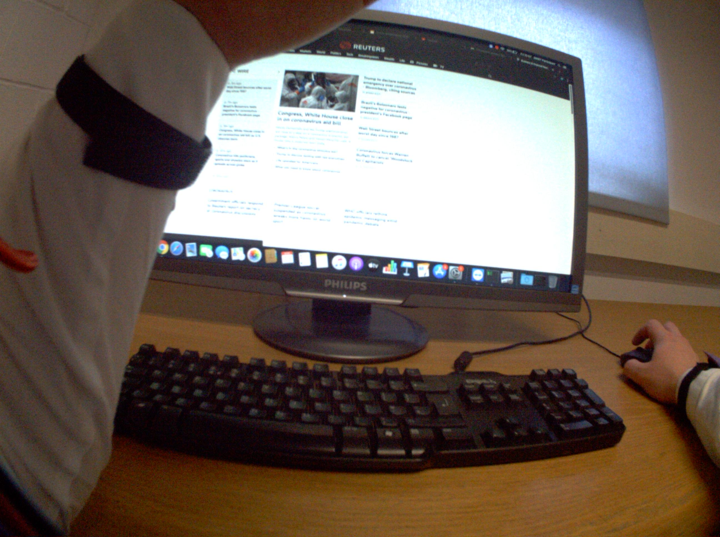
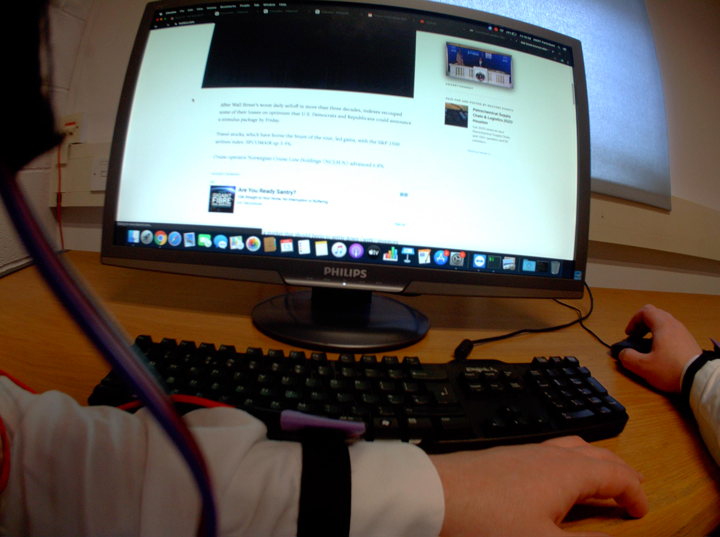
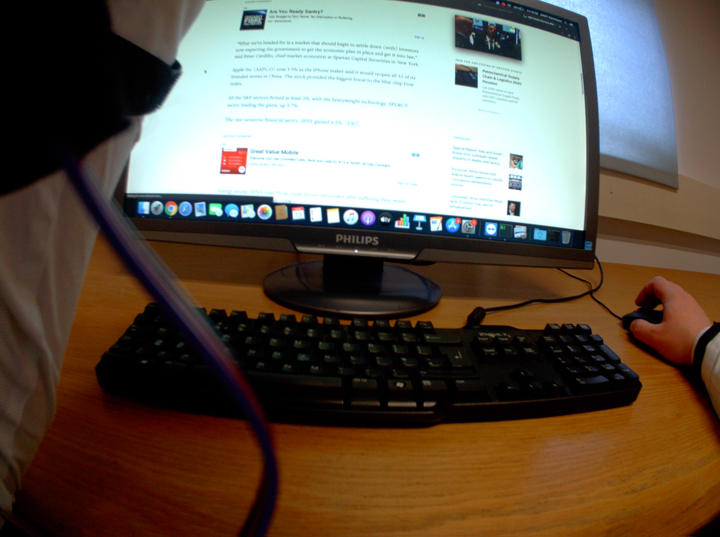
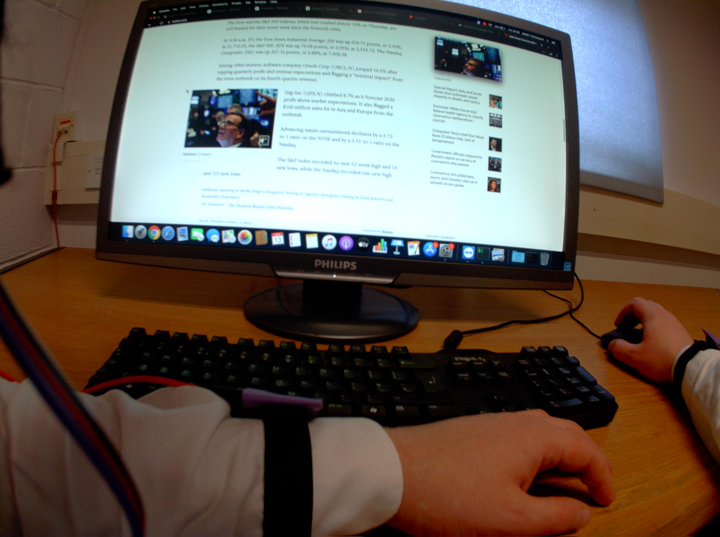
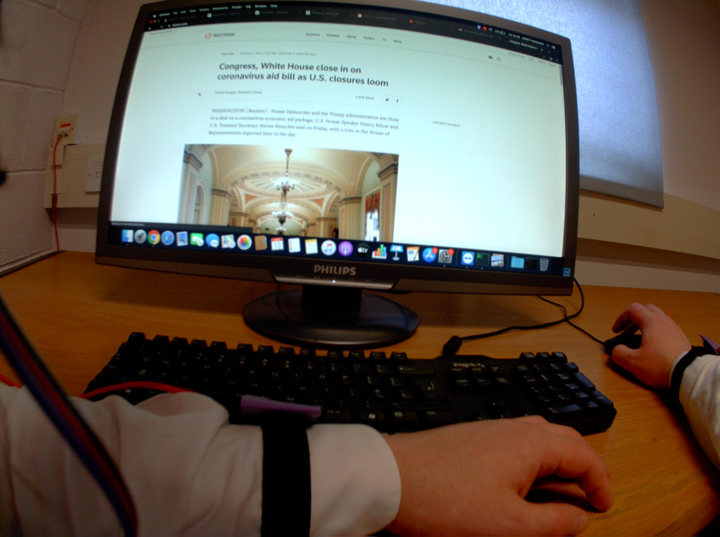
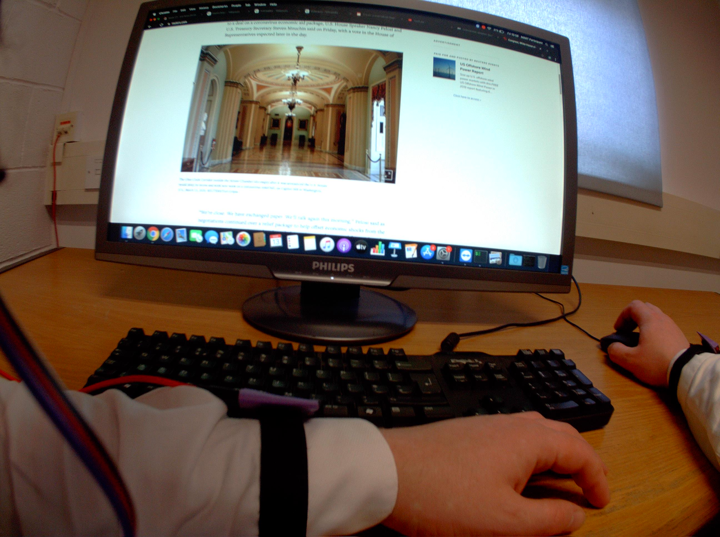
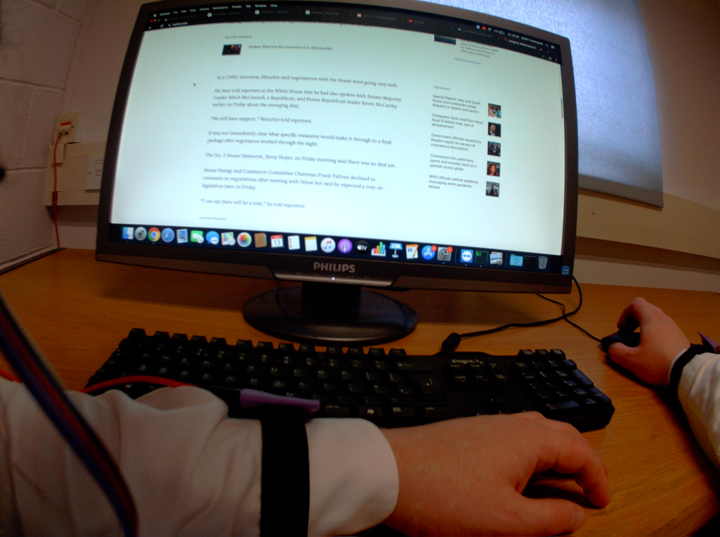
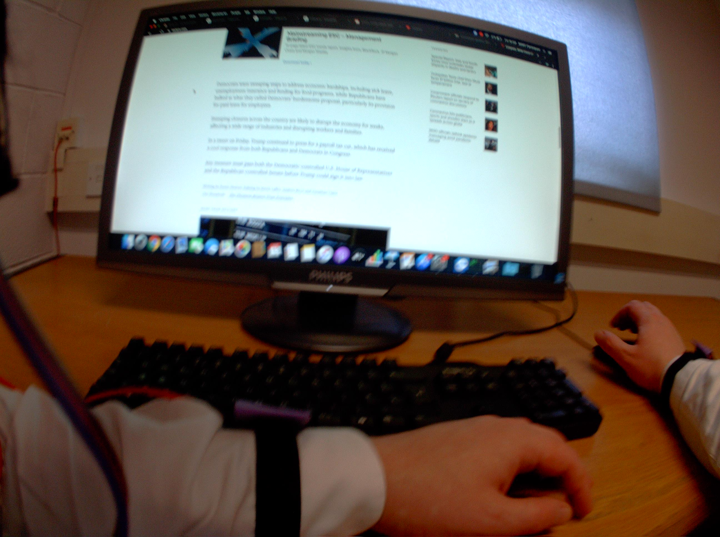

In [9]:
row = 10
task = task_id[row]
images_path = [x for x in all_imgs if task in x]
images = [Image.open(f"{IMG_DIR}/{path}") for path in images_path]
images = np.asarray(images, dtype=np.object)
ipyplot.plot_images(images, images_path, max_images=20, img_width=360)